# 'Binary LSI' scRNA-seq Workflow

This notbook outlines the workflow for preprocessing, binarization, & tf-idf/LSI (term frequency inverse document frequency & Latent Semantic Indexing) of a single-cell rna-seq (scRNA-seq) dataset provided as an anndata object compatible with Scanpy. Preprocessing and QC are based on typical parameters for scRNA-seq analyses in Scanpy.

In this notebook, Binary LSI is demonstrated on the pbmc3k, pbmc10k, and pancreatic datasets.

In [1]:
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
import scanpy as sc
import pandas as pd
import numpy as np
import anndata
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk

from sklearn.metrics import adjusted_rand_score

In [6]:
import muon as mu
import muon.atac as ac

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/Caskroom/miniconda/base/e

In [2]:
import rpy2
%load_ext rpy2.ipython

In [95]:
# set folder to save figures and set a prefix for figure names

figdir = 'figure_S3/'
prefix = 'figure_S3_'


In [96]:
# set default plot size and dpi for all plots in notebook

sc.settings.set_figure_params(dpi=300, dpi_save=300, vector_friendly=True, fontsize=12, figsize=(4, 4))
sc.settings.figdir = figdir
sc.settings._file_format_figs = 'svg'

In [57]:
sns.set_context('paper', font_scale=1.5)

In [58]:
plt.rcParams["axes.grid"] = False

'preprocess_adata' defines a function that takes an anndata object and returns a preprocessed anndata object.

The function performs the following steps:
    
        - log transform the data
        - regress out the effect of the number of genes expressed per cell
        - regress out the effect of the percentage of mitochondrial/ribosomal/hemoglobin genes expressed per cell
        - calculate highly variable genes
       
If the 'binary' parameter is set to True, the function will also binarize the data by setting all values above 0 to 1. Binarized values are transformed using tf-idf.

If 'binary' is set to False, the function will also perform the following steps:
        
           - normalize to 10,000 counts per cell
           - log transform the data
           - scale the data to unit variance

The function returns the preprocessed anndata object.

In [27]:

def preprocess_adata(adata, binary=False, min_genes=200, min_cells=3, mt_pattern='MT-', ribo_pattern=("RPS", "RPL"), hb_pattern="^HB[^(P)]"):
    if not isinstance(adata, anndata.AnnData):
        raise ValueError("Input is not a valid AnnData object")

    adata = adata.copy()
    adata.var_names_make_unique()
    adata.obs_names_make_unique()

    # Define mitochondrial, ribosomal, and hemoglobin genes
    adata.var['mt'] = adata.var_names.str.startswith(mt_pattern)
    adata.var['ribo'] = adata.var_names.str.startswith(ribo_pattern)
    adata.var['hb'] = adata.var_names.str.contains(hb_pattern)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo', 'hb'], percent_top=None, log1p=False, inplace=True)

    # Filter cells and genes
    sc.pp.filter_cells(adata, min_genes=min_genes)
    sc.pp.filter_genes(adata, min_cells=min_cells)

    # Additional quality control based on QC metrics
    adata = adata[adata.obs['pct_counts_mt'] < 20, :]  # Filter based on mitochondrial content
    adata = adata[adata.obs['pct_counts_ribo'] < 30, :]  # Filter based on ribosomal content

    if binary:
        adata.X = (adata.X > 0).astype(np.int8)
        
        # TF-IDF transformation and scaling to 10000 counts per cell
        
        ac.pp.tfidf(adata, scale_factor=1e4)

        adata.raw = adata
        
    else:
        adata.raw = adata

    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata)
    sc.pp.scale(adata, max_value=10)

    return adata[:, adata.var.highly_variable]


'parser_standard_lsi' defines a function that accepts as input an anndata object, and returns a dictionary of processed prebinary and binary lsi versions of the anndata. If the 'batch_key' parameter is set, batch correction is performed using bbknn. Muon is used for tf-idf/lsi of the binarized data.

The function also performs PCA dimensionality reduction, neighborhood graph construction, and Leiden clustering. The resolution hyperparameter for Leiden clustering may be adjusted from the default '1' via the 'resolution' parameter.

In [7]:
def parser_standard_lsi(adata, batch_key=None, resolution=1):
    result_dict = {}
    adata_prebinary = preprocess_adata(adata)
    adata_bin = preprocess_adata(adata, binary=True)

    for adata_processed, key in zip([adata_prebinary, adata_bin], ['Prebinary', 'Binary_LSI']):

        # Perform downstream analysis steps
        # Regress out effects of total counts and potentially other confounders
        sc.pp.regress_out(adata_processed, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo'])
        if key != 'Binary_LSI':
            # Dimensionality reduction
            sc.tl.pca(adata_processed, svd_solver='arpack')
        if key == 'Binary_LSI':
            ac.tl.lsi(adata_processed)
            # first component of lsi is dropped
            adata_processed.obsm['X_lsi'] = adata_processed.obsm['X_lsi'][:,1:]
            # Downstream umap calculation uses pca by default, so we copy the lsi results to the pca slot
            adata_processed.obsm['X_pca'] = adata_processed.obsm['X_lsi']


        # Find neighbors
        if batch_key is not None:
            sc.external.pp.bbknn(adata_processed, batch_key=batch_key)
        else:
            sc.pp.neighbors(adata_processed, n_pcs=30)#, use_rep='X_pca')
        
        sc.tl.umap(adata_processed)
        sc.tl.leiden(adata_processed, resolution=resolution, key_added=f'{key}_cluster')

        # Store the results
        result_dict[key] = adata_processed

    # Share the binary cluster labels with the prebinary data
    result_dict['Prebinary'].obs['Binary_LSI_cluster'] = result_dict['Binary_LSI'].obs['Binary_LSI_cluster']

    return result_dict


## PBMC3k dataset

In [8]:
# load raw pbmc3k data
pbmc_file = sc.read('pbmc3k_file.h5ad')

In [18]:
pbmc_file

AnnData object with n_obs × n_vars = 2700 × 32738
    var: 'gene_ids'

In [9]:
# load previously annotated pbmc3k data
pbmc3k_standard = sc.read_h5ad('pbmc3k_standard.h5ad')

In [64]:
pbmc_result = parser_standard_lsi(pbmc_file, resolution=0.8)

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/muon/_atac/preproc.py:84: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/muon/_atac/preproc.py:106: RuntimeWarning: divide by zero encountered in divide
  idf = np.asarray(adata.shape[0] / adata.X.sum(axis=0)).reshape(-1)


In [11]:
pbmc_result

{'Prebinary': AnnData object with n_obs × n_vars = 2698 × 1865
     obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'Prebinary_cluster', 'Binary_LSI_cluster'
     var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
     uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     obsp: 'distances', 'connectivities',
 'Binary_LSI': AnnData object with n_obs × n_vars = 2698 × 3723
     obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'Binary_LSI_cluster'
     var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropo

In [12]:
pbmc_prebinary = pbmc_result['Prebinary']
pbmc_binary = pbmc_result['Binary_LSI']
pbmc_prebinary.obs['cell_type'] = pbmc3k_standard.obs['cell_type'].astype('category')
pbmc_binary.obs['cell_type'] = pbmc3k_standard.obs['cell_type'].astype('category')

In [14]:
# drop cells in prebinary & binary data that are not in pbmc3k_standard

pbmc_prebinary = pbmc_prebinary[pbmc_prebinary.obs.index.isin(pbmc3k_standard.obs.index)]
pbmc_binary = pbmc_binary[pbmc_binary.obs.index.isin(pbmc3k_standard.obs.index)]

In [16]:
pbmc_binary

View of AnnData object with n_obs × n_vars = 2638 × 3723
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'Binary_LSI_cluster', 'cell_type'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'lsi', 'neighbors', 'umap', 'leiden'
    obsm: 'X_lsi', 'X_pca', 'X_umap'
    varm: 'LSI'
    obsp: 'distances', 'connectivities'

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


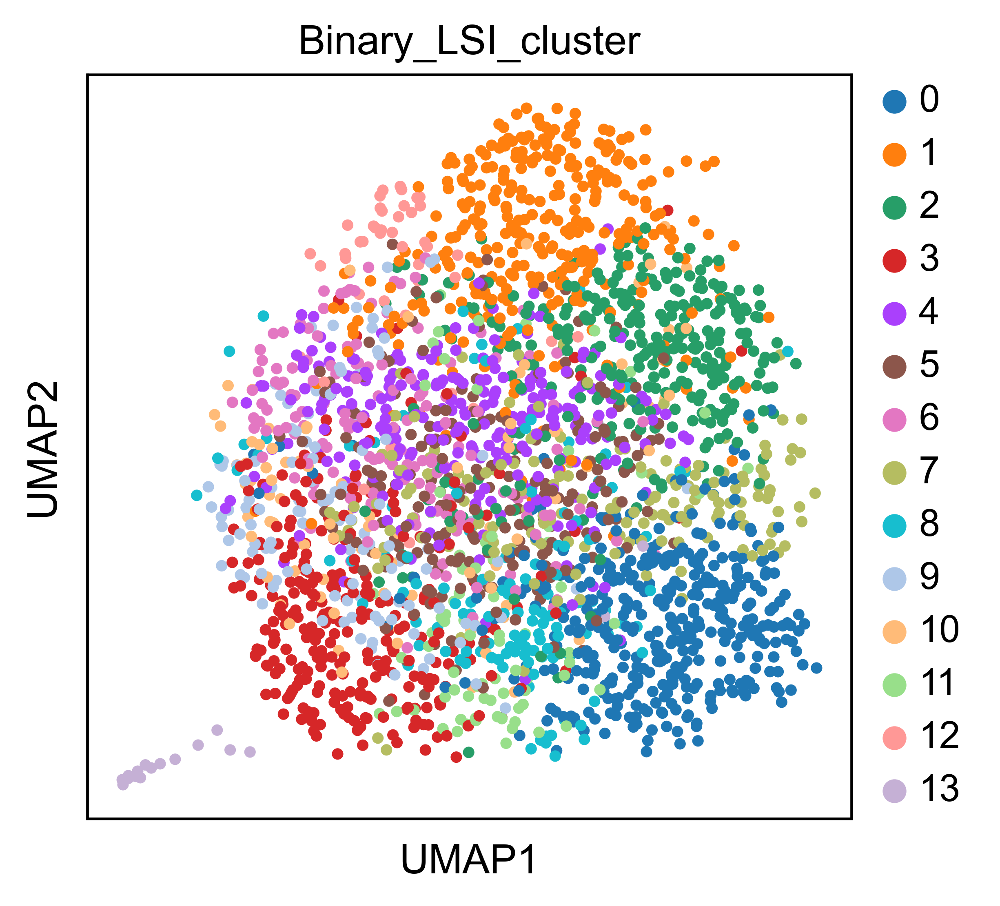

In [17]:
sc.pl.umap(pbmc_binary, color=['Binary_LSI_cluster'])#, size=10, save=f'{prefix}a2.svg')

In [53]:
pbmc3k_markers = {'B': ['MS4A1', 'CD79A'],   
                'CD4 T': ['IL7R', 'CCR7'],
                'CD8 T': ['CD8A'],
                'CD14 Monocytes': ['CD14'],
                'Dendritic': ['FCER1A', 'CD1C'],
                'FCG3A Monocytes': ['FCGR3A', 'MS4A7'], 
                'Megakaryocytes': ['PPBP', 'PF4'],
                'NK': ['GNLY', 'NKG7'],}

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


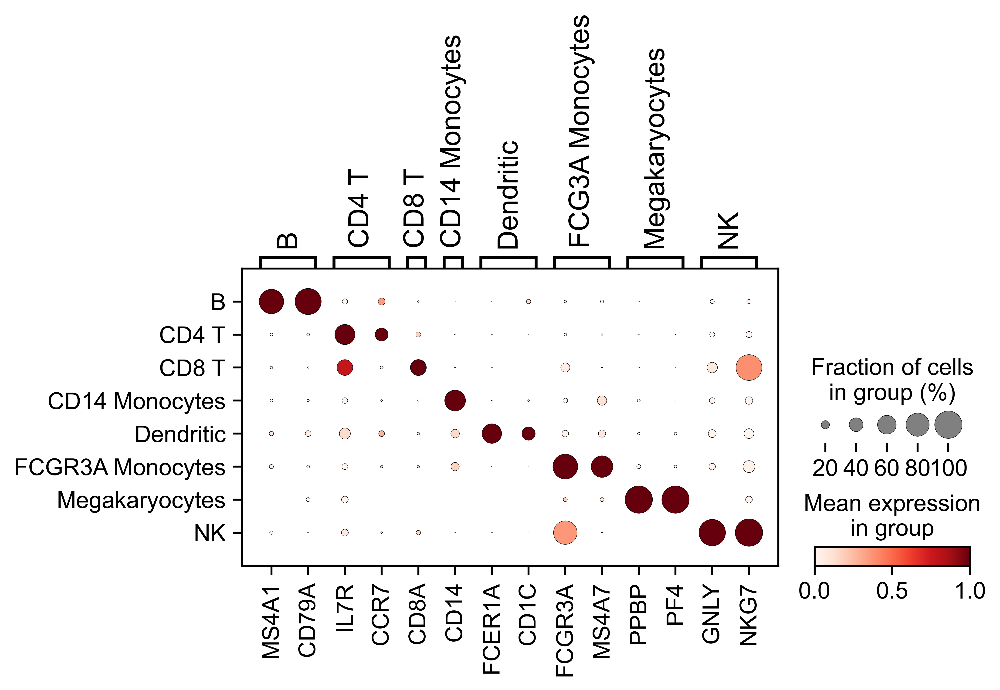

In [47]:
sc.pl.dotplot(pbmc_prebinary, pbmc3k_markers, groupby='cell_type', standard_scale='var', save=f'{prefix}celltype.svg')

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


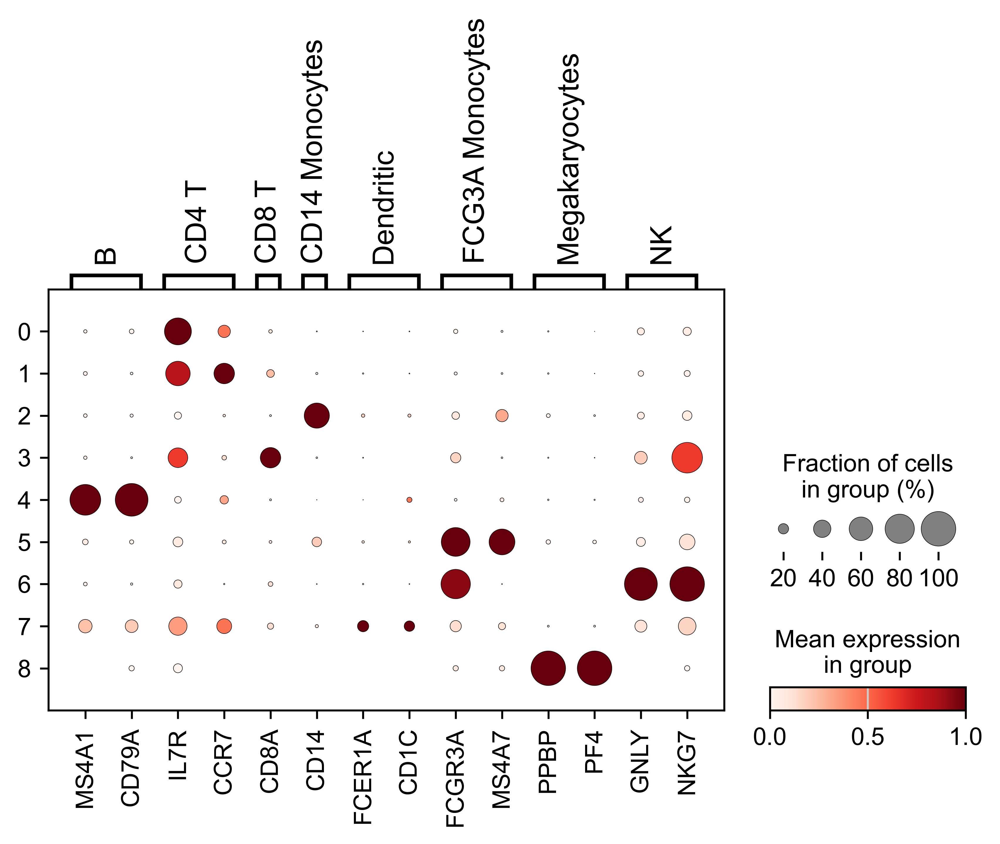

In [54]:
sc.pl.dotplot(pbmc_prebinary, pbmc3k_markers, groupby='Binary_LSI_cluster', standard_scale='var',  save=f'{prefix}b.svg')

In [99]:
# Annotated heatmap of cell type vs cluster

def create_annotated_heatmap(df, col1, col2):
    # Create a crosstab between the specified columns
    crosstab = pd.crosstab(df[col1], df[col2])

    # Normalize each column by its maximum
    normalized_crosstab = crosstab.div(crosstab.max(axis=0), axis=1)

    # Create the heatmap
    plt.figure(figsize=(10, 8))  # Optional: Adjust the size as needed
    return sns.heatmap(normalized_crosstab, cmap='Blues', annot=crosstab, fmt='g', 
                linewidths=.5, linecolor='black').set_title(f'{col1} vs. {col2}')



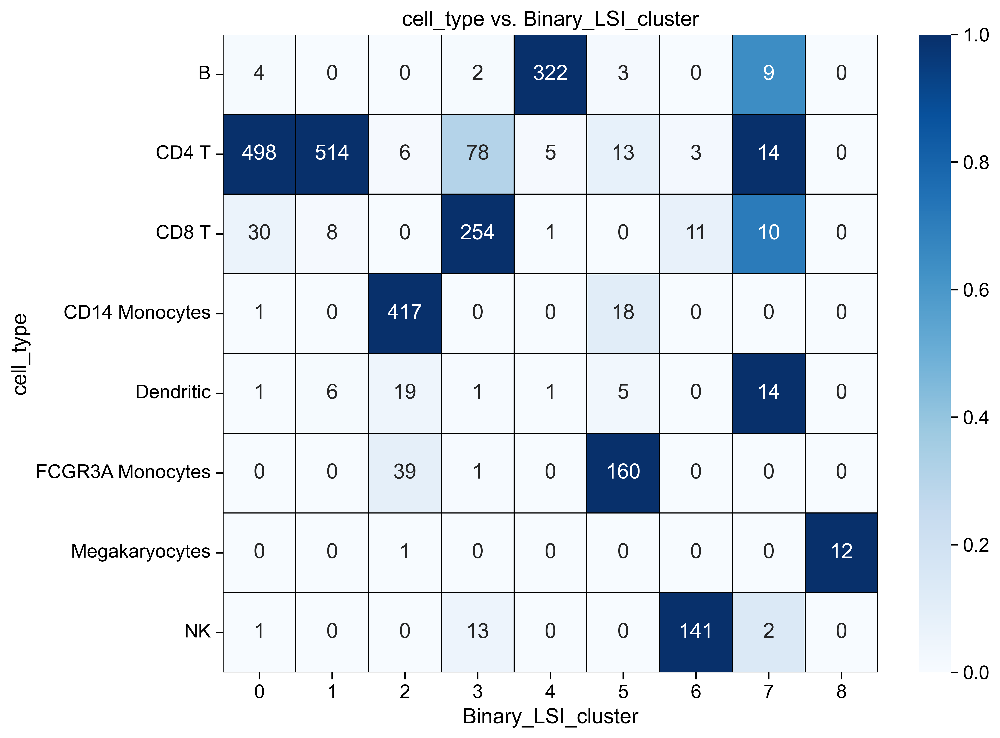

In [59]:
heatmap_fig = create_annotated_heatmap(pbmc_binary.obs, 'cell_type', 'Binary_LSI_cluster')

In [17]:
pbmc_binary

View of AnnData object with n_obs × n_vars = 2638 × 3723
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'Binary_LSI_cluster', 'cell_type'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'lsi', 'neighbors', 'umap', 'leiden'
    obsm: 'X_lsi', 'X_pca', 'X_umap'
    varm: 'LSI'
    obsp: 'distances', 'connectivities'

In [61]:
heatmap_fig.get_figure().savefig(f'{prefix}c.svg', dpi=300, bbox_inches='tight')

In [18]:
def cluster_accuracy(adata):
    crosstab = pd.crosstab(adata.obs['Binary_LSI_cluster'], adata.obs['cell_type'])
    accuracy = crosstab.max(axis=1)/crosstab.sum(axis=1)
    return accuracy

In [20]:
pbmc_crosstab = pd.crosstab(pbmc_binary.obs['Binary_LSI_cluster'], pbmc_binary.obs['cell_type'])

In [24]:
pbmc_crosstab

cell_type,B,CD4 T,CD8 T,CD14 Monocytes,Dendritic,FCGR3A Monocytes,Megakaryocytes,NK
Binary_LSI_cluster,,,,,,,,
0,2,52,10,278,7,4,0,0
1,127,28,44,1,7,0,0,135
2,50,62,178,6,6,4,0,11
3,19,84,3,10,0,126,0,1
4,22,135,19,7,3,3,0,2
5,22,118,11,10,2,15,0,1
6,24,108,12,12,5,4,0,1
7,13,107,5,22,3,15,0,1
8,16,94,4,8,5,9,0,3


In [23]:
# from pbmc_crosstab, add up all cells that are in column max for all, and give it as a percentage of the matrix total 

pbmc_crosstab.max(axis=1).sum()/pbmc_crosstab.sum().sum()



0.6197877179681577

In [ ]:
# from pbmc_crosstab, add up all cells that are in column max for all, and give it as a percentage of the matrix total 

pan_crosstab.max(axis=1).sum()/pbmc_crosstab.sum().sum()



0.7414708112206216

In [19]:
# using the function above, calculate the accuracy of each cluster, give an average and the range 

cluster_accuracy(pbmc_binary).mean()



0.640620160116803

In [22]:
cluster_accuracy(pbmc_binary).sort_values()

Binary_LSI_cluster
1     0.394737
11    0.433962
3     0.518519
2     0.561514
12    0.640777
7     0.644578
6     0.650602
5     0.659218
10    0.666667
8     0.676259
4     0.706806
9     0.717949
14    0.722222
0     0.787535
13    0.827957
dtype: float64

## PBMC10k Dataset

In [ ]:
# load raw pbmc10k data

pbmc10k_file = mu.read('pbmc10k.h5mu')

In [ ]:
rna_pbmc10k = pbmc10k_file['rna'].copy()

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [ ]:
rna_pbmc10k

AnnData object with n_obs × n_vars = 11909 × 36601
    var: 'gene_ids', 'feature_types', 'genome', 'interval'

In [ ]:
# loading previously annotated pbmc10k dataset

pbmc10k_standard = mu.read('pbmc10k.h5mu')

In [ ]:
pbmc10k_standard['rna']

AnnData object with n_obs × n_vars = 9658 × 26349
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# Filtering to cells that have both RNA and ATAC data for downstream comparison

mu.pp.intersect_obs(pbmc10k_standard)

In [ ]:
# Current notebook only considers scRNA-seq data so we restrict to RNA data

rna_standard_pbmc10k = pbmc10k_standard['rna'].copy()

In [ ]:
# delete cells in rna_pbmc10k that are not in rna_standard_pbmc10k

rna_pbmc10k = rna_pbmc10k[rna_pbmc10k.obs.index.isin(rna_standard_pbmc10k.obs.index),:]

In [ ]:
pbmc10k_rna_only_result = parser_standard_lsi(rna_pbmc10k, resolution=0.9)

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/muon/_atac/preproc.py:84: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_cor

In [ ]:
pbmc10k_binary = pbmc10k_rna_only_result['Binary_LSI']

In [ ]:
pbmc10k_binary

AnnData object with n_obs × n_vars = 9622 × 6180
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'Binary_LSI_cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'lsi', 'neighbors', 'umap', 'leiden'
    obsm: 'X_lsi', 'X_pca', 'X_umap'
    varm: 'LSI'
    obsp: 'distances', 'connectivities'

In [ ]:
pbmc10k_binary.obs['rna_celltype'] = rna_standard_pbmc10k.obs['celltype']

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


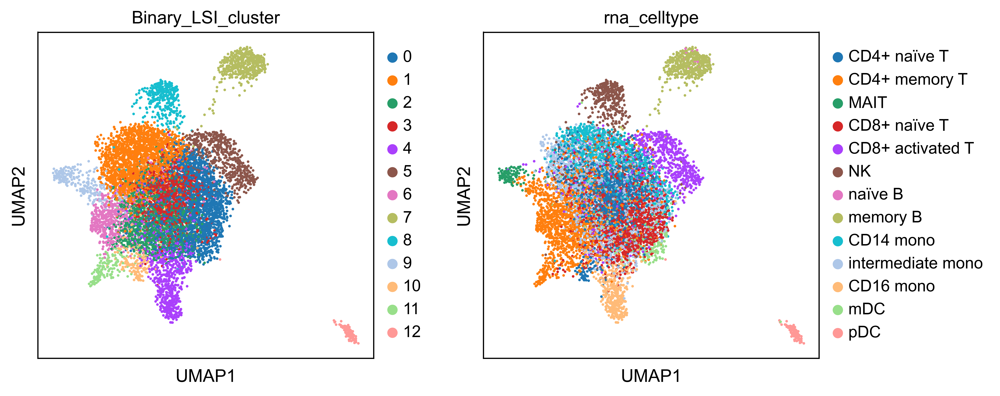

In [ ]:
sc.pl.umap(pbmc10k_binary, color=['Binary_LSI_cluster', 'rna_celltype'])

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


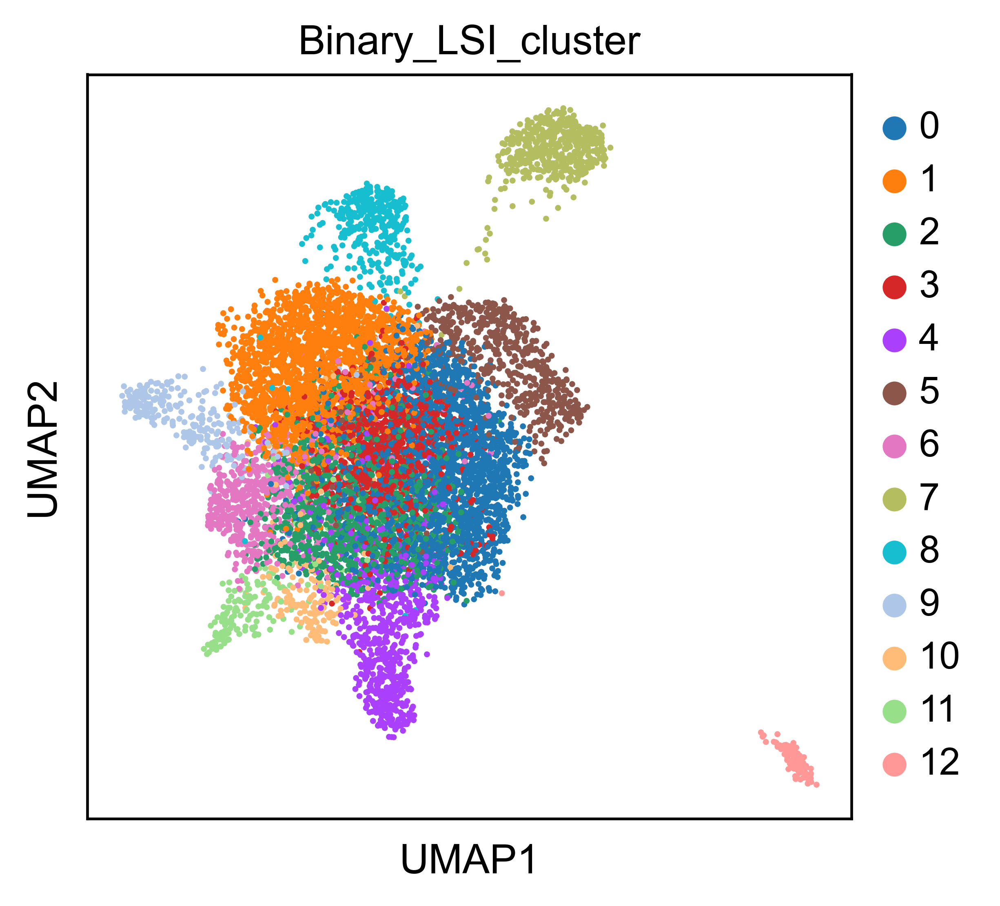

In [ ]:
sc.pl.umap(pbmc10k_binary, color=['Binary_LSI_cluster'], save='pbmc10k_rna_only_binary_cluster.svg')

In [ ]:
sc.tl.umap(pbmc10k_binary, min_dist=0.3, spread=1.5)

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


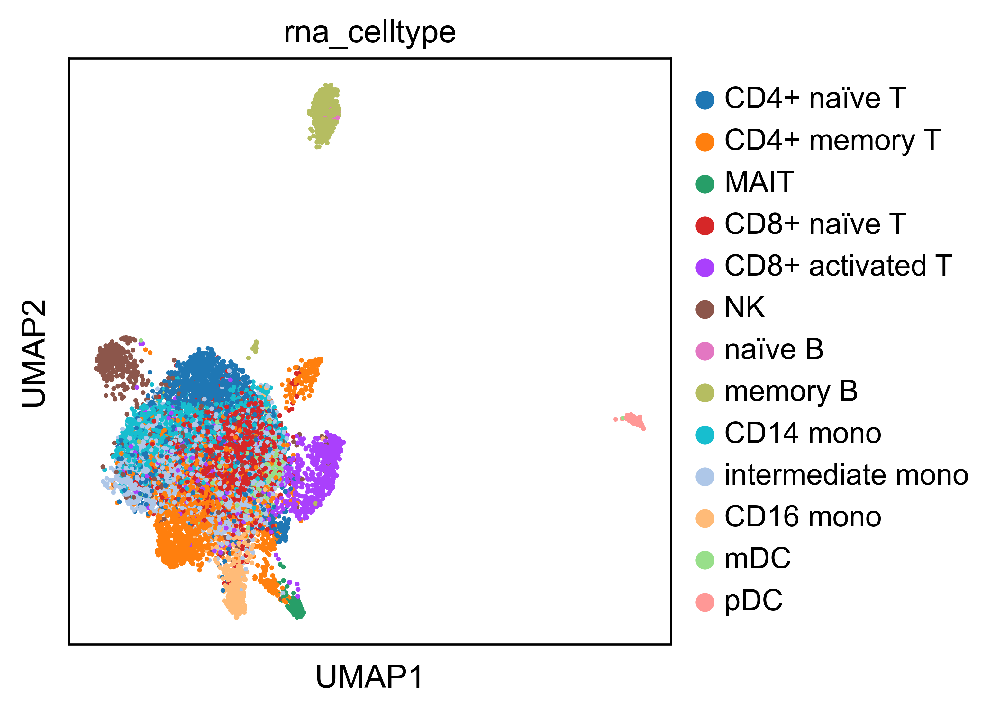

In [ ]:
sc.pl.umap(pbmc10k_binary, color=['rna_celltype'], save='pbmc10k_rna_only_celltype2.svg')

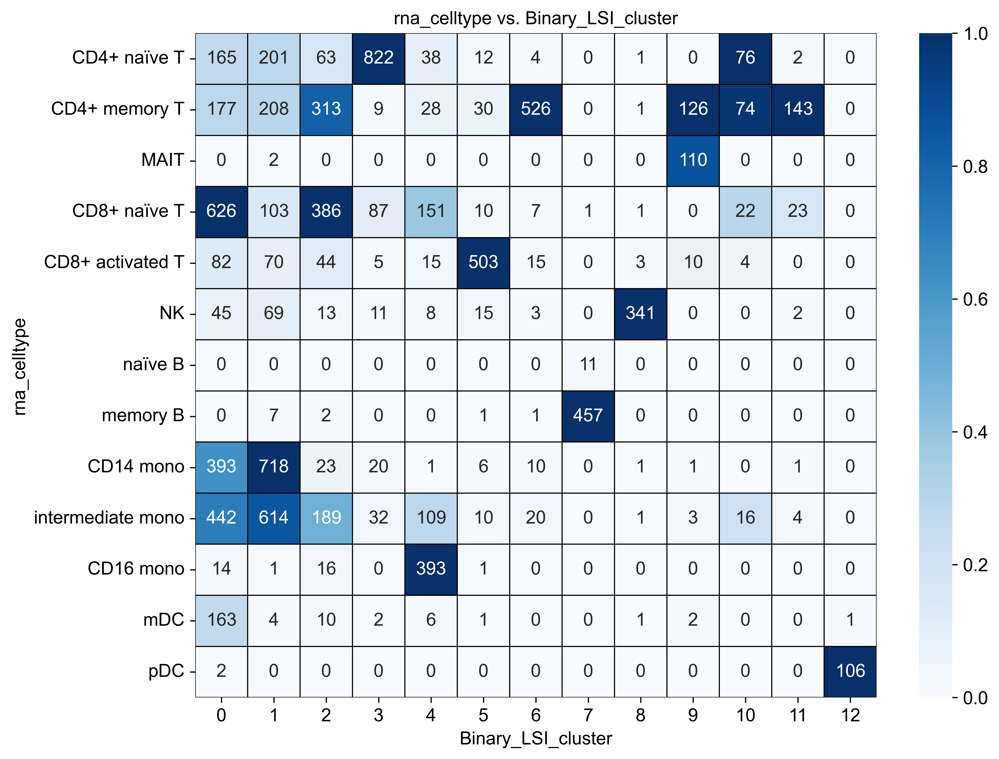

In [ ]:
pbmc10k_rna_only_binary_heatmap = create_annotated_heatmap(pbmc10k_binary.obs, 'rna_celltype', 'Binary_LSI_cluster')

In [ ]:
pbmc10k_rna_only_binary_heatmap.get_figure().savefig(figdir + prefix + 'pbmc10k_rna_only_binary_heatmap.svg', bbox_inches='tight')

# Pancreatic Data

In [63]:
# pancreatic data

pancreatic_metadata = pd.read_table('E-MTAB-5061.sdrf.txt', index_col=0)
pancreatic_data = sc.read('pancreas_data_flip_tpm.txt')

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [24]:
# pancreatic specific preprocessing

pancreatic_data.obs["Individual"] = pancreatic_metadata['Characteristics[individual]']        
pancreatic_data.obs['Cell_Type'] = pancreatic_metadata['Factor Value[cell type]']
pancreatic_data = pancreatic_data[~pancreatic_data.obs.Cell_Type.isin(["not applicable"])]
pancreatic_data.obs['Condition'] = pancreatic_metadata['Factor Value[disease]']

/var/folders/xj/p_ddg_256k37zv0c7cy37hb40000gn/T/ipykernel_28995/945338462.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  pancreatic_data.obs['Condition'] = pancreatic_metadata['Factor Value[disease]']
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [65]:
smart_metadata = pd.read_table('E-MTAB-5061.sdrf.txt', index_col=0)

In [25]:
pancreatic_data

AnnData object with n_obs × n_vars = 2209 × 26178
    obs: 'Individual', 'Cell_Type', 'Condition'

In [26]:
pan_result = parser_standard_lsi(pancreatic_data, batch_key='Individual', resolution=1.5)

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/annd

In [68]:
pan_result

{'tpm': {'raw': AnnData object with n_obs × n_vars = 2209 × 3977
      obs: 'Individual', 'Cell_Type', 'Condition', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
      var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
      obsm: 'X_pca', 'X_umap'
      varm: 'PCs'
      obsp: 'distances', 'connectivities',
  'bin': AnnData object with n_obs × n_vars = 2209 × 5087
      obs: 'Individual', 'Cell_Type', 'Condition', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'Binary_LSI'
      var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
      uns: 'log1p', 'hvg', 'lsi', 'neighbors', 'umap', 'leiden'
     

In [70]:
pan_prebinary = pan_result['tpm']['raw']
pan_binary = pan_result['tpm']['bin']
pan_prebinary.obs['Binary_LSI_cluster'] = pan_binary.obs['Binary_LSI']
pan_binary.obs['Prebinary_cluster'] = pan_prebinary.obs['leiden']
pan_binary.obs['Binary_LSI_cluster'] = pan_binary.obs['Binary_LSI']


/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


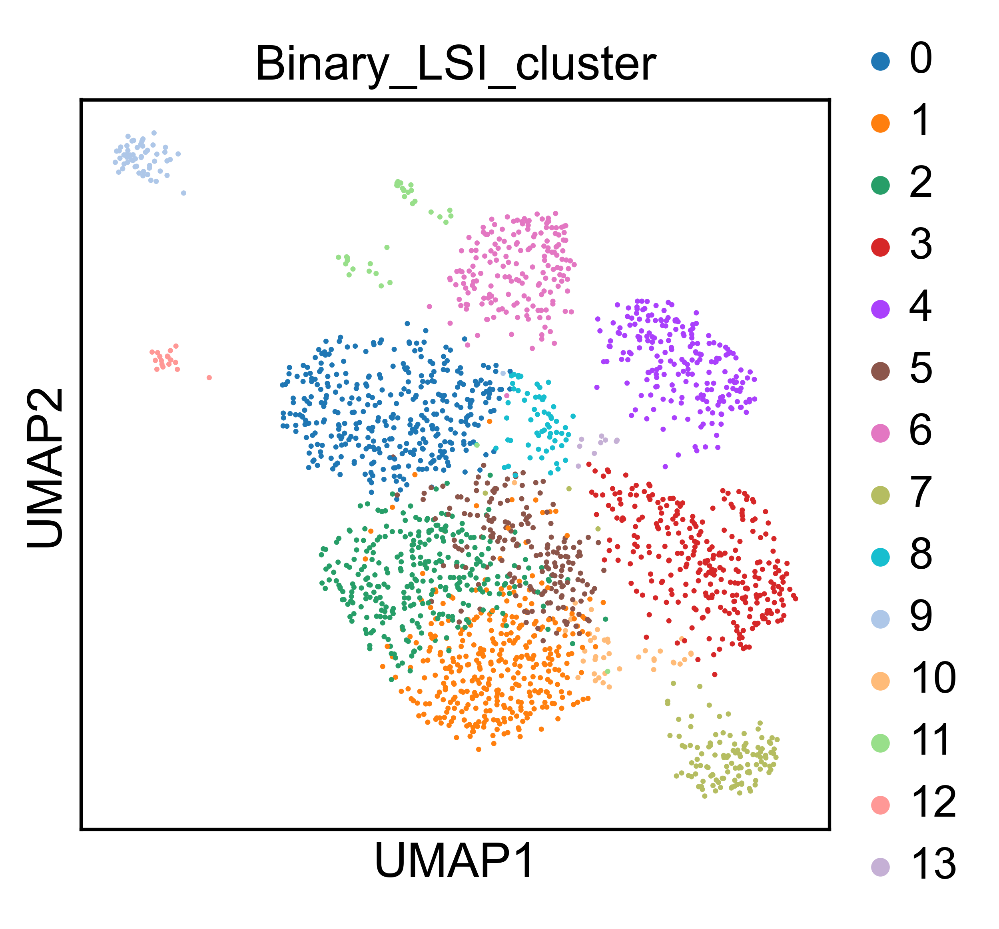

In [73]:
sc.pl.umap(pan_binary, color=['Binary_LSI_cluster'], size=10, save=f'{prefix}d.svg')

In [74]:

pan_markers = {'MHC class II cell': ['CD86', 'HLA-DPA1'],
               'PSC cell': ['ACTA2', 'FN1'],
               'acinar cell': ['PRSS1'],
               'alpha cell': ['DPP4', 'GPR119'],
               'beta cell': ['INS', 'LINC01099'],
               'delta cell': ['LEPR', 'GHSR'],
               'ductal cell': ['KRT19'],
               'endothelial cell': ['PLVAP', 'PECAM1'],
               'epsilon cell': ['GHRL', 'GHRLOS'],
               'gamma cell': ['SERTM1', 'PPY'],
               'mast cell': ['TPSAB1', 'TPSB2'],
               'unclassified endocrine cell': ['RCAN1', 'NOV']
               }


/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


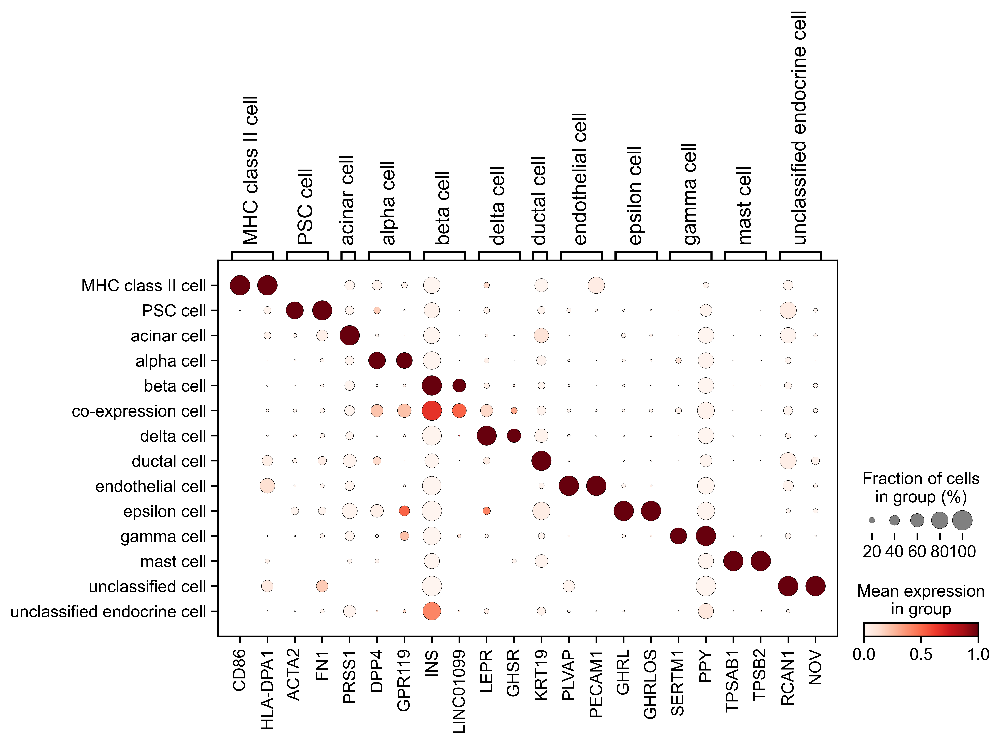

In [30]:
sc.pl.dotplot(pan_result['Prebinary'], pan_markers, groupby='Cell_Type', standard_scale='var', save=f'{prefix}pan_celltype.svg')

/usr/local/Caskroom/miniconda/base/envs/muon_compat/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


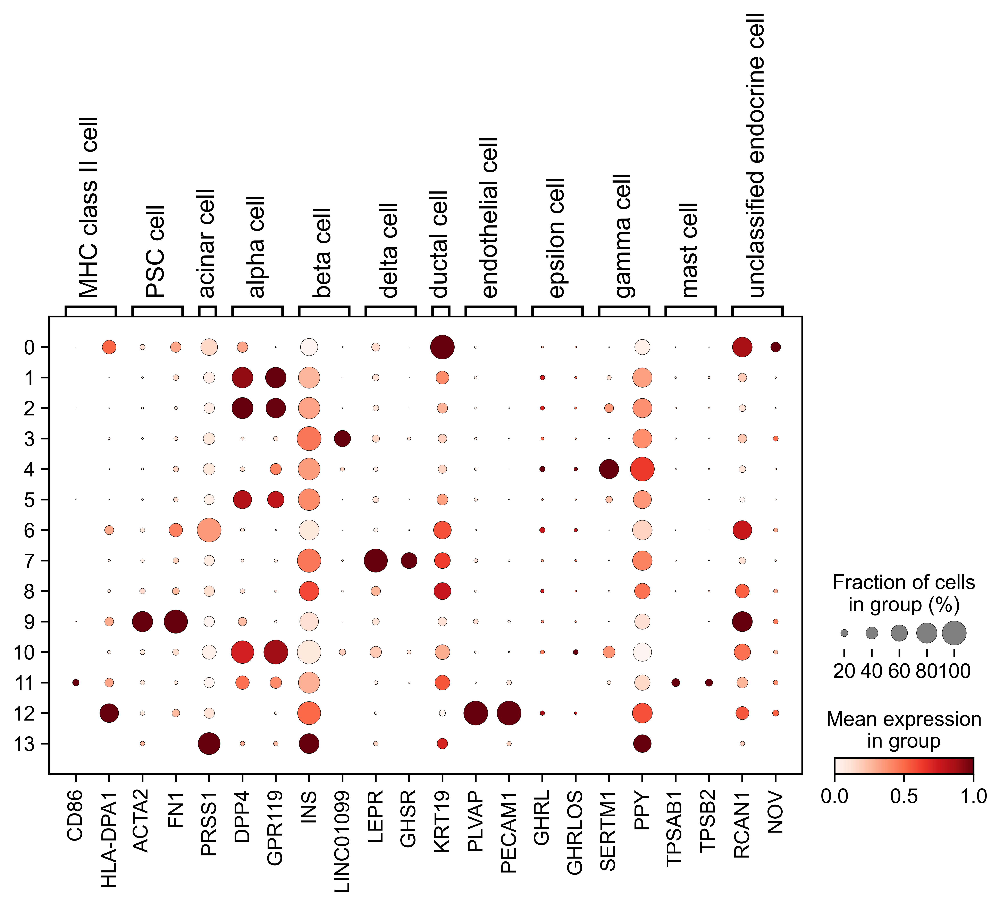

In [75]:
sc.pl.dotplot(pan_binary, pan_markers, groupby='Binary_LSI_cluster', standard_scale='var', save=f'{prefix}e.svg')

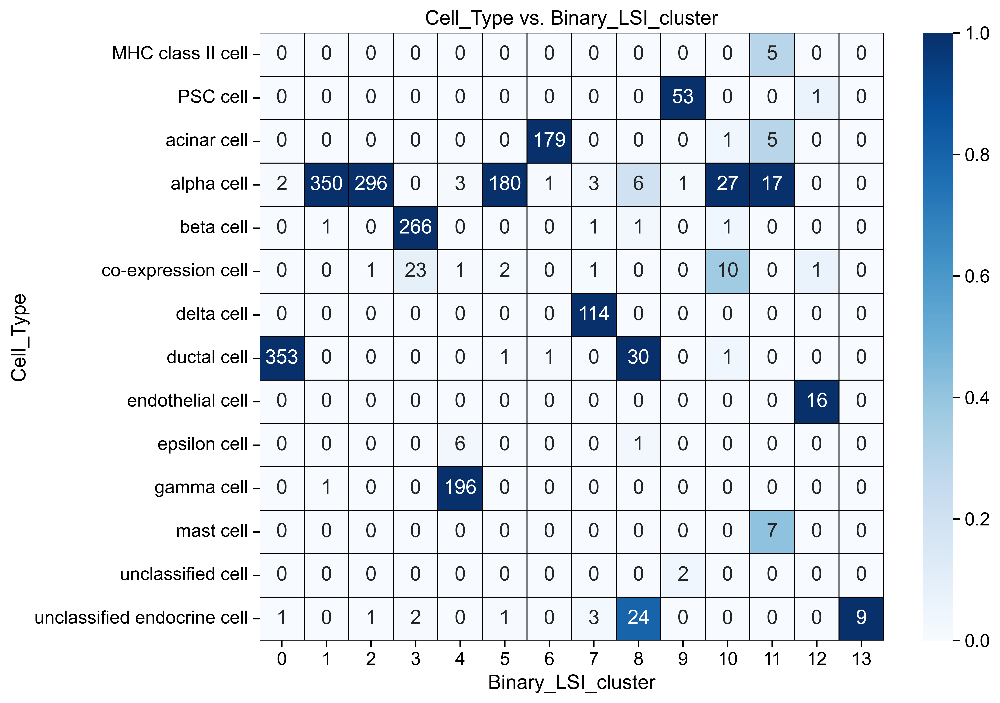

In [76]:
pan_heatmap_fig = create_annotated_heatmap(pan_binary.obs, 'Cell_Type', 'Binary_LSI_cluster')

In [78]:
pan_heatmap_fig.get_figure().savefig(f'{prefix}f.svg', dpi=300, bbox_inches='tight')

In [34]:
pan_pd = pan_result['Binary'].obs[['Cell_Type', 'Binary_cluster']]

In [35]:
%%R -i pan_pd

library(tidyverse)
library(ggalluvial)

alluvialplot <- function(labelsdf, repel, nudge_x, ggfittext, ...){


  if( missing(repel) ){ repel = T}
  if( missing(nudge_x) ){nudge_x = 0.3}

  if( missing(ggfittext) ){ggfittext = F}


  #if levels not set, get them by ordering hi > lo

  labelsdf2 <- lapply(labelsdf, function(i){
    if( !is.factor(i) ){
      factor(i, levels = names(sort(table(i),decreasing = T)))
    } else{
      i
    }
  })

  labelsdf <- data.frame(labelsdf2, row.names = rownames(labelsdf))

  require(ggalluvial)

  #for ease, we'll set colnames to from and to
  # colnames(labelsdf)[1:2] <- c('From', 'To')
  # do this with .data trick now to keep colname!


  # turn it into a matrix
  mat <- table(labelsdf[,1], labelsdf[,2])


  #make the table long format
  longfreqs <- reshape2::melt(mat)
  colnames(longfreqs) <- c(colnames(labelsdf)[1:2], 'Freq')


  #factorize, using input levels or existing levels
  # inputting levels is mostly about order.


  longfreqs[,1] <- factor(longfreqs[,1], levels = levels(labelsdf[,1]) )
  longfreqs[,2] <- factor(longfreqs[,2], levels = levels(labelsdf[,2]))

  #if both are numerics, it seems to cause an issue, so convert to char vector...
  # if(is.numeric(longfreqs)[1] & is.numeric(longfreqs)[2])
  # can't reporduce that problem...


  if(ggfittext == T){

    require(ggfittext)
    ap <- ggplot(longfreqs, aes(y = Freq, axis1=.data[[colnames(longfreqs[1])]], axis2= .data[[colnames(longfreqs[2])]] ))+
      geom_alluvium(aes(fill= .data[[colnames(longfreqs[1])]] )) +
      geom_stratum()+
      #geom_label(stat = "stratum", aes(label = after_stat(stratum)))+
      ggfittext::geom_fit_text(stat = "stratum",aes(label = after_stat(stratum)), width = 1/4, min.size = 3) +
      theme_void()


  } else if(repel==T){

    require(ggrepel)

    ap <- ggplot(longfreqs, aes(y = Freq, axis1=.data[[colnames(longfreqs[1])]], axis2= .data[[colnames(longfreqs[2])]] ) )+
      scale_x_discrete(expand = c(0.2, 0)) +
      geom_alluvium( aes(fill= .data[[colnames(longfreqs[1])]] ), width = 0.2 ) +
      geom_stratum(width = 0.2) +
      scale_linetype_manual(values = c("blank", "solid")) +

      ggrepel::geom_label_repel(
        aes(label = .data[[colnames(longfreqs[1])]] ),
        stat = "stratum", nudge_x = nudge_x * -1, ...) +

      ggrepel::geom_label_repel(
        aes(label = .data[[colnames(longfreqs[2])]]),
        stat = "stratum", nudge_x = nudge_x, ...) +
      theme_void()

  } else{

    ap <- ggplot(longfreqs, aes(y = Freq, axis1=.data[[colnames(longfreqs[1])]], axis2= .data[[colnames(longfreqs[2])]] ) )+
      geom_alluvium(aes(fill= .data[[colnames(longfreqs[1])]] )) +
      geom_stratum()+
      geom_label(stat = "stratum", aes(label = after_stat(stratum)))+
      # ggfittext::geom_fit_text(stat = "stratum",aes(label = after_stat(stratum)), width = 1/4, min.size = 3) +
      theme_void()


  }
  ap

}

alluvialplot(pan_pd, repel=T, nudge_x=0.3, ggfittext=F)#, dpi=300, height=15, width=30)
ggsave('figure_S3/S3_pan_alluvial.svg', dpi=300, height=10, width=10)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.2     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


R[write to console]: Loading required package: ggrepel



In [36]:
pbmc_pd = pbmc_result['Binary'].obs[['cell_type', 'Binary_cluster']]

In [37]:
%%R -i pbmc_pd

library(tidyverse)
library(ggalluvial)

alluvialplot <- function(labelsdf, repel, nudge_x, ggfittext, ...){


  if( missing(repel) ){ repel = T}
  if( missing(nudge_x) ){nudge_x = 0.3}

  if( missing(ggfittext) ){ggfittext = F}


  #if levels not set, get them by ordering hi > lo

  labelsdf2 <- lapply(labelsdf, function(i){
    if( !is.factor(i) ){
      factor(i, levels = names(sort(table(i),decreasing = T)))
    } else{
      i
    }
  })

  labelsdf <- data.frame(labelsdf2, row.names = rownames(labelsdf))

  require(ggalluvial)

  #for ease, we'll set colnames to from and to
  # colnames(labelsdf)[1:2] <- c('From', 'To')
  # do this with .data trick now to keep colname!


  # turn it into a matrix
  mat <- table(labelsdf[,1], labelsdf[,2])


  #make the table long format
  longfreqs <- reshape2::melt(mat)
  colnames(longfreqs) <- c(colnames(labelsdf)[1:2], 'Freq')


  #factorize, using input levels or existing levels
  # inputting levels is mostly about order.


  longfreqs[,1] <- factor(longfreqs[,1], levels = levels(labelsdf[,1]) )
  longfreqs[,2] <- factor(longfreqs[,2], levels = levels(labelsdf[,2]))

  #if both are numerics, it seems to cause an issue, so convert to char vector...
  # if(is.numeric(longfreqs)[1] & is.numeric(longfreqs)[2])
  # can't reporduce that problem...


  if(ggfittext == T){

    require(ggfittext)
    ap <- ggplot(longfreqs, aes(y = Freq, axis1=.data[[colnames(longfreqs[1])]], axis2= .data[[colnames(longfreqs[2])]] ))+
      geom_alluvium(aes(fill= .data[[colnames(longfreqs[1])]] )) +
      geom_stratum()+
      #geom_label(stat = "stratum", aes(label = after_stat(stratum)))+
      ggfittext::geom_fit_text(stat = "stratum",aes(label = after_stat(stratum)), width = 1/4, min.size = 3) +
      theme_void()


  } else if(repel==T){

    require(ggrepel)

    ap <- ggplot(longfreqs, aes(y = Freq, axis1=.data[[colnames(longfreqs[1])]], axis2= .data[[colnames(longfreqs[2])]] ) )+
      scale_x_discrete(expand = c(0.2, 0)) +
      geom_alluvium( aes(fill= .data[[colnames(longfreqs[1])]] ), width = 0.2 ) +
      geom_stratum(width = 0.2) +
      scale_linetype_manual(values = c("blank", "solid")) +

      ggrepel::geom_label_repel(
        aes(label = .data[[colnames(longfreqs[1])]] ),
        stat = "stratum", nudge_x = nudge_x * -1, ...) +

      ggrepel::geom_label_repel(
        aes(label = .data[[colnames(longfreqs[2])]]),
        stat = "stratum", nudge_x = nudge_x, ...) +
      theme_void()

  } else{

    ap <- ggplot(longfreqs, aes(y = Freq, axis1=.data[[colnames(longfreqs[1])]], axis2= .data[[colnames(longfreqs[2])]] ) )+
      geom_alluvium(aes(fill= .data[[colnames(longfreqs[1])]] )) +
      geom_stratum()+
      geom_label(stat = "stratum", aes(label = after_stat(stratum)))+
      # ggfittext::geom_fit_text(stat = "stratum",aes(label = after_stat(stratum)), width = 1/4, min.size = 3) +
      theme_void()


  }
  ap

}

alluvialplot(pbmc_pd, repel=T, nudge_x=0.3, ggfittext=F)#, dpi=300, height=15, width=30)
ggsave('figure_S3/S3_pbmc_alluvial.svg', dpi=300, height=10, width=10)